# Chest X-Ray Pneumonia (Transfer Learning Experiment )
- ### DenseNet121 FineTuning Experiment Analysis

## 1. Environment
분석 환경에 따라 프로젝트와 공통 라이브러리 경로를 설정합니다.

In [1]:
## PC 전용(기본 경로)
import sys

sys.path.insert(0, r"D:\DEV\AI\src")
sys.path.insert(0, r"D:\DEV\AI\projects\chest-xray-pneumonia")

In [2]:
import sys
import importlib

# ============================================================
# Environment
# ============================================================ 
ENV = "pc"  

# ============================================================
# Project Configuration
# ============================================================

import cxp.cxp_config as cxp_config

importlib.reload(cxp_config)

config = cxp_config.configure_environment(ENV)


# ============================================================
# Python Path
# ============================================================

PROJECT_ROOT = config["PROJECT_ROOT"]
AILIB_ROOT = config["AILIB_ROOT"]

if str(AILIB_ROOT) not in sys.path:
    sys.path.insert(0, str(AILIB_ROOT))

if str(PROJECT_ROOT) not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT))


# ============================================================
# Project Configuration
# ============================================================

DATA_ROOT = config["DATA_ROOT"]
PROCESSED_DATA_DIR = config["PROCESSED_DATA_DIR"]

TRAIN_DIR = config["TRAIN_DIR"]
VAL_DIR = config["VAL_DIR"]
TEST_DIR = config["TEST_DIR"]

IMAGE_INFO_CSV  = config["IMAGE_INFO_CSV"]

LOCAL_TRAIN_DIR = config["LOCAL_TRAIN_DIR"]
LOCAL_VAL_DIR = config["LOCAL_VAL_DIR"]
LOCAL_TEST_DIR = config["LOCAL_TEST_DIR"]

DATASET_TRAIN_DIR = config["DATASET_TRAIN_DIR"]
DATASET_VAL_DIR = config["DATASET_VAL_DIR"]
DATASET_TEST_DIR = config["DATASET_TEST_DIR"]

EXPERIMENTS_DIR = config["EXPERIMENTS_DIR"]
MODELS_DIR = config["MODELS_DIR"]
REPORTS_DIR = config["REPORTS_DIR"]

CLASS_TO_IDX = config["CLASS_TO_IDX"]
IDX_TO_CLASS = config["IDX_TO_CLASS"]


# ============================================================
# Environment Check
# ============================================================

print("=" * 60)
print("Environment Configuration")
print("=" * 60)

print(f"Environment     : {ENV}")
print(f"Project Root    : {PROJECT_ROOT}")
print(f"AI Library      : {AILIB_ROOT}")
print(f"Experiments Dir : {EXPERIMENTS_DIR}")
print(f"Reports Dir     : {REPORTS_DIR}")

print("=" * 60)

Environment Configuration
Environment     : pc
Project Root    : D:\DEV\AI\projects\chest-xray-pneumonia
AI Library      : D:\DEV\AI\src
Experiments Dir : D:\DEV\AI\projects\chest-xray-pneumonia\experiments
Reports Dir     : D:\DEV\AI\projects\chest-xray-pneumonia\reports


In [3]:
import plotly.io as pio

# 깃허브에서 보이도록 기본 렌더러를 정적 이미지로 변경
pio.renderers.default = "png" 
# 만약 화질이 깨져서 선명하게 보고 싶다면 "svg"를 사용하셔도 됩니다.

## 2. Load Reports 

In [4]:
# ============================================================
# 2. Load Experiment Reports
# ============================================================

from pathlib import Path
import pandas as pd

REPORTS_DIR = Path(REPORTS_DIR)

metadata_path = REPORTS_DIR / "experiment_metadata.csv"
history_path = REPORTS_DIR / "experiment_history.csv"

experiment_summary = pd.read_csv(metadata_path)
history_df = pd.read_csv(history_path)

print("=" * 60)
print("Loaded Experiment Reports")
print("=" * 60)

print(f"Metadata : {metadata_path}")
print(f"History  : {history_path}")

print()
print(f"Summary shape : {experiment_summary.shape}")
print(f"History shape : {history_df.shape}")

Loaded Experiment Reports
Metadata : D:\DEV\AI\projects\chest-xray-pneumonia\reports\experiment_metadata.csv
History  : D:\DEV\AI\projects\chest-xray-pneumonia\reports\experiment_history.csv

Summary shape : (14, 20)
History shape : (230, 8)


## 3. Experiment List
 

In [5]:
# ============================================================
# 3. Experiment List
# ============================================================

experiment_names = experiment_summary["experiment"].unique()

print("=" * 60)
print("Experiments")
print("=" * 60)

for i, name in enumerate(experiment_names, 1):

    runs = experiment_summary.loc[
        experiment_summary["experiment"] == name,
        "run"
    ].tolist()

    print(f"{i}. {name}")
    print(f"   Runs: {runs}")

Experiments
1. TL-DENSENET121-FULL
   Runs: ['LR1', 'LR2']
2. TL-DENSENET121-LR
   Runs: ['LR1', 'LR2']
3. TL-DENSENET121-PARTIAL
   Runs: ['LR1', 'LR2']
4. TL-RESNET50-FULL
   Runs: ['LR2', 'LR2-EPOCH20']
5. TL-RESNET50-LR
   Runs: ['LR1', 'LR2', 'LR2-EPOCH20', 'LR3']
6. TL-RESNET50-PARTIAL
   Runs: ['LR2', 'LR2-EPOCH20']


## 4.  Experiment Metadata

In [6]:
# ============================================================
# 4.  Experiment Metadata
# ============================================================

overview_columns = [
    "experiment",
    "run",
    "model",
    "image_size",
    "normalization",
    "augmentation",
    "batch_size",
    "optimizer",
    "learning_rate",
    "num_epochs",
    "best_epoch",
    "best_validation_loss",
    "best_validation_accuracy",
]

display(
    experiment_summary[overview_columns]
    .sort_values(
        ["experiment", "run"]
    )
    .reset_index(drop=True)
)

,experiment,run,model,image_size,normalization,augmentation,batch_size,optimizer,learning_rate,num_epochs,best_epoch,best_validation_loss,best_validation_accuracy
0,TL-DENSENET121-FULL,LR1,DenseNet,512,imagenet_mean_std,none,16,Adam,0.00100,20,17,0.032354,0.992337
1,TL-DENSENET121-FULL,LR2,DenseNet,512,imagenet_mean_std,none,16,Adam,0.00010,20,13,0.007616,0.996169
2,TL-DENSENET121-LR,LR1,DenseNet,512,imagenet_mean_std,none,64,Adam,0.00100,20,17,0.085301,0.969349
3,TL-DENSENET121-LR,LR2,DenseNet,512,imagenet_mean_std,none,64,Adam,0.00010,20,20,0.164848,0.944444
4,TL-DENSENET121-PARTIAL,LR1,DenseNet,512,imagenet_mean_std,none,64,Adam,0.00100,20,15,0.020797,0.995211
5,TL-DENSENET121-PARTIAL,LR2,DenseNet,512,imagenet_mean_std,none,64,Adam,0.00010,20,10,0.029739,0.990421
6,TL-RESNET50-FULL,LR2,ResNet,512,imagenet_mean_std,none,16,Adam,0.00010,10,10,0.016960,0.993295
7,TL-RESNET50-FULL,LR2-EPOCH20,ResNet,512,imagenet_mean_std,none,16,Adam,0.00010,20,7,0.018109,0.993295
8,TL-RESNET50-LR,LR1,ResNet,512,train_mean_std,none,64,Adam,0.00100,10,10,0.115350,0.954023
9,TL-RESNET50-LR,LR2,ResNet,512,train_mean_std,none,64,Adam,0.00010,10,10,0.239991,0.918582


## 5. Validation Loader

In [7]:
# ============================================================
# 5. Validation Loader
# ============================================================

import json

from ailib.data_split_v2 import split_train_validation
from ailib.transform_v2 import create_transform
from ailib.dataset_v2 import ImageDataset
from ailib.dataloader_v2 import create_dataloader


# ============================================================
# Batch Size : 실험환경에 따라 변경
# ============================================================

BATCH_SIZE = 16


# ============================================================
# Load Split Metadata
# ============================================================

split_config_path = REPORTS_DIR / "split_config.json"

if not split_config_path.exists():
    raise FileNotFoundError(
        f"Split metadata not found: {split_config_path}"
    )

with open(
    split_config_path,
    "r",
    encoding="utf-8",
) as f:
    split_config = json.load(f)


# ============================================================
# Split Configuration
# ============================================================

VAL_SIZE = split_config["validation"]["size"]
RANDOM_STATE = split_config["validation"]["random_state"]
STRATIFY_COLUMN = split_config["validation"]["stratify_column"]


# ============================================================
# Preprocessing Configuration
# ============================================================

IMAGE_SIZE = split_config["preprocessing"]["image_size"]
NORMALIZATION = split_config["preprocessing"]["normalization"]


# ============================================================
# Load Dataset Metadata
# ============================================================

image_info = pd.read_csv(IMAGE_INFO_CSV)


# ============================================================
# Recreate Train / Validation Split
# ============================================================

train_df, val_df = split_train_validation(
    dataframe=image_info,
    val_size=VAL_SIZE,
    random_state=RANDOM_STATE,
    stratify_column=STRATIFY_COLUMN,
)


# ============================================================
# Validation Transform
# ============================================================

eval_transform = create_transform(
    image_size=IMAGE_SIZE,
    mean=NORMALIZATION["mean"],
    std=NORMALIZATION["std"],
)


# ============================================================
# Validation Dataset
# ============================================================

val_dataset = ImageDataset(
    dataframe=val_df,
    data_dir=DATASET_TRAIN_DIR,
    class_to_idx=CLASS_TO_IDX,
    transform=eval_transform,
)


# ============================================================
# Validation DataLoader
# ============================================================

val_loader = create_dataloader(
    dataset=val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
)


# ============================================================
# Result
# ============================================================

print("=" * 60)
print("Validation Loader")
print("=" * 60)

print(f"Split Version : {split_config['version']}")
print(f"Validation    : {len(val_dataset)}")
print(f"Image Size    : {IMAGE_SIZE}")
print(f"Batch Size    : {BATCH_SIZE}")
print(f"Shuffle       : False")
print("=" * 60)

Validation Loader
Split Version : 1.0
Validation    : 1044
Image Size    : 512
Batch Size    : 16
Shuffle       : False


##  Analysis 

### 1. Analysis Configuration

In [ ]:
# ============================================================
# Analysis
# 1. Analysis Configuration
# ============================================================

import json
from pathlib import Path

import pandas as pd
import torch
from ailib.device import get_device


# ------------------------------------------------------------
# Analysis settings
# ------------------------------------------------------------

SELECTED_EXPERIMENTS = [
    "TL-densenet121-FULL",
    "TL-densenet121-PARTIAL", 
]

DEVICE = get_device()


print(f"Device: {DEVICE}")
print(f"Selected Experiments: {SELECTED_EXPERIMENTS}")

Device: cuda
Selected Experiments: ['TL-densenet50-FULL', 'TL-densenet50-PARTIAL']


### 2. Experiment Selection

### 추가 실험 -> 실험 결정

* **DenseNet121 — Learning Rate 변경:** Validation 성능의 변동이 확인되어 Learning Rate를 낮춰 추가 실험하였다. 


In [9]:
# ============================================================
# 2. Experiment Selection
# ============================================================

SELECTED_RUNS = [
    ("TL-DENSENET121-PARTIAL", "LR1"),
    ("TL-DENSENET121-PARTIAL", "LR2"),
    ("TL-DENSENET121-FULL", "LR1"),
    ("TL-DENSENET121-FULL", "LR2"),
]

selected_summary = experiment_summary[
    experiment_summary.apply(
        lambda row: (row["experiment"], row["run"]) in SELECTED_RUNS,
        axis=1,
    )
].copy()

selected_summary = (
    selected_summary
    .sort_values(["experiment", "run"])
    .reset_index(drop=True)
)

print(f"Experiments: {selected_summary['experiment'].nunique()}")
print(f"Runs: {len(selected_summary)}")

display(
    selected_summary[
        ["experiment", "run", "model", "learning_rate", "num_epochs"]
    ]
)

Experiments: 2
Runs: 4


,experiment,run,model,learning_rate,num_epochs
0,TL-DENSENET121-FULL,LR1,DenseNet,0.0010,20
1,TL-DENSENET121-FULL,LR2,DenseNet,0.0001,20
2,TL-DENSENET121-PARTIAL,LR1,DenseNet,0.0010,20
3,TL-DENSENET121-PARTIAL,LR2,DenseNet,0.0001,20


### 3. Selected Experiment Overview

In [10]:
# ============================================================
# 3. Selected Experiment Overview
# ============================================================

overview_columns = [
    "experiment",
    "run",
    "model",
    "image_size",
    "normalization",
    "augmentation",
    "batch_size",
    "optimizer",
    "learning_rate",
    "num_epochs",
    "best_epoch",
    "best_validation_loss",
    "best_validation_accuracy",
]

available_columns = [
    column
    for column in overview_columns
    if column in selected_summary.columns
]

display(
    selected_summary[
        available_columns
    ].reset_index(drop=True)
)

,experiment,run,model,image_size,normalization,augmentation,batch_size,optimizer,learning_rate,num_epochs,best_epoch,best_validation_loss,best_validation_accuracy
0,TL-DENSENET121-FULL,LR1,DenseNet,512,imagenet_mean_std,none,16,Adam,0.0010,20,17,0.032354,0.992337
1,TL-DENSENET121-FULL,LR2,DenseNet,512,imagenet_mean_std,none,16,Adam,0.0001,20,13,0.007616,0.996169
2,TL-DENSENET121-PARTIAL,LR1,DenseNet,512,imagenet_mean_std,none,64,Adam,0.0010,20,15,0.020797,0.995211
3,TL-DENSENET121-PARTIAL,LR2,DenseNet,512,imagenet_mean_std,none,64,Adam,0.0001,20,10,0.029739,0.990421


### 4. Validation Evaluation

#### 4-1. Model Load

In [12]:
# ============================================================
# 4. Validation Evaluation
# 4-1. Model Load
# ============================================================

from cxp.cxp_model import (
    build_transfer_model,
    configure_fine_tuning,
)


def load_experiment_model(run_info):
    """
    Load a trained experiment model using experiment metadata.
    """

    experiment = run_info["experiment"]
    run = run_info["run"]

    model_path = (
        EXPERIMENTS_DIR
        / experiment
        / run
        / "model.pth"
    )

    # ========================================================
    # Model Configuration
    # ========================================================

    model_name = run_info["model"]
    channels = run_info["channels"]

    model_name = "densenet121"
        

    # ========================================================
    # Fine-Tuning Mode
    # ========================================================

    if "FULL" in experiment:
        fine_tuning_mode = "full"
    elif "PARTIAL" in experiment:
        fine_tuning_mode = "partial"
    else:
        raise ValueError(
            f"Unknown fine-tuning experiment: {experiment}"
        )

    # ========================================================
    # Build Model
    # ========================================================

    model = build_transfer_model(
        model_name=model_name,
        num_classes=2,
        in_channels=channels,
        pretrained=True,
    )

    # ========================================================
    # Configure Model
    # ========================================================

    model = configure_fine_tuning(
        model=model,
        model_name=model_name,
        fine_tuning_mode=fine_tuning_mode,
    )

    # ========================================================
    # Load Checkpoint
    # ========================================================

    checkpoint = torch.load(
        model_path,
        map_location=DEVICE,
    )

    model.load_state_dict(checkpoint)

    model = model.to(DEVICE)
    model.eval()

    return model

#### 4-2. Run Evaluation

In [13]:
# ============================================================
# 4-2. Run Evaluation
# ============================================================

from cxp.cxp_evaluation import (
    predict,
    calculate_metrics,
)

validation_results = []
validation_predictions = {}

for _, run_info in selected_summary.iterrows():

    experiment = run_info["experiment"]
    run = run_info["run"]

    print(
        f"Evaluating: {experiment} / {run}"
    )

    # --------------------------------------------------------
    # Load Model
    # --------------------------------------------------------

    model = load_experiment_model(
        run_info
    )

    # --------------------------------------------------------
    # Prediction
    # --------------------------------------------------------

    labels, predictions, probabilities = predict(
        model=model,
        loader=val_loader,
        device=DEVICE,
    )

    # --------------------------------------------------------
    # Metrics
    # --------------------------------------------------------

    metrics = calculate_metrics(
        labels=labels,
        predictions=predictions,
        probabilities=probabilities,
    )

    validation_results.append({
        "experiment": experiment,
        "run": run,
        **metrics,
    })

    # --------------------------------------------------------
    # Store Predictions
    # --------------------------------------------------------

    validation_predictions[(experiment, run)] = {
        "labels": labels,
        "predictions": predictions,
        "probabilities": probabilities,
    }

    # --------------------------------------------------------
    # Cleanup
    # --------------------------------------------------------

    del model

    if DEVICE.type == "cuda":
        torch.cuda.empty_cache()

Evaluating: TL-DENSENET121-FULL / LR1
Evaluating: TL-DENSENET121-FULL / LR2
Evaluating: TL-DENSENET121-PARTIAL / LR1
Evaluating: TL-DENSENET121-PARTIAL / LR2


#### 4-3. Validation Metrics

In [17]:
# ============================================================
# 4-3. Validation Metrics
# ============================================================

validation_results_df = pd.DataFrame(
    validation_results
)

validation_results_df = (
    validation_results_df
    .sort_values(
        ["experiment", "run"],
        key=lambda s: (
            s.map({
                "TL-DENSENET121-PARTIAL": 0,
                "TL-DENSENET121-FULL": 1,
                "LR1": 0,
                "LR2": 1,
            })
            if s.name == "experiment"
            else s.map({
                "LR1": 0,
                "LR2": 1,
            })
        )
    )
    .reset_index(drop=True)
)

metric_columns = [
    "accuracy",
    "precision",
    "recall",
    "specificity",
    "f1",
    "roc_auc",
]

display(
    validation_results_df[
        ["experiment", "run"] + metric_columns
    ]
)

,experiment,run,accuracy,precision,recall,specificity,f1,roc_auc
0,TL-DENSENET121-PARTIAL,LR1,0.993295,0.997413,0.993557,0.992537,0.995481,0.999721
1,TL-DENSENET121-PARTIAL,LR2,0.990421,0.992288,0.994845,0.977612,0.993565,0.999226
2,TL-DENSENET121-FULL,LR1,0.908046,0.889908,1.000000,0.641791,0.941748,0.995882
3,TL-DENSENET121-FULL,LR2,0.990421,0.998698,0.988402,0.996269,0.993523,0.999519


In [18]:
# ============================================================
# Validation Metrics - Percentage View
# ============================================================

display(
    validation_results_df[
        ["experiment", "run"] + metric_columns
    ]
    .style
    .format({
        column: "{:.4f}"
        for column in metric_columns
    })
)

,experiment,run,accuracy,precision,recall,specificity,f1,roc_auc
0,TL-DENSENET121-PARTIAL,LR1,0.9933,0.9974,0.9936,0.9925,0.9955,0.9997
1,TL-DENSENET121-PARTIAL,LR2,0.9904,0.9923,0.9948,0.9776,0.9936,0.9992
2,TL-DENSENET121-FULL,LR1,0.9080,0.8899,1.0000,0.6418,0.9417,0.9959
3,TL-DENSENET121-FULL,LR2,0.9904,0.9987,0.9884,0.9963,0.9935,0.9995


In [19]:
# ============================================================
# Confusion Matrix Counts
# ============================================================

confusion_columns = [
    "tn",
    "fp",
    "fn",
    "tp",
]

display(
    validation_results_df[
        ["experiment", "run"] + confusion_columns
    ]
)

,experiment,run,tn,fp,fn,tp
0,TL-DENSENET121-PARTIAL,LR1,266,2,5,771
1,TL-DENSENET121-PARTIAL,LR2,262,6,4,772
2,TL-DENSENET121-FULL,LR1,172,96,0,776
3,TL-DENSENET121-FULL,LR2,267,1,9,767


### 5. Experiment Comparison

#### 5-1. Classification Metrics

In [ ]:
# # ============================================================
# # 5. Experiment Comparison
# # 5-1. Classification Metrics
# # ============================================================

# # import importlib
# # import cxp.cxp_plot as cxp_plot

# # importlib.reload(cxp_plot)

# cxp_plot.plot_metric_comparison(
#     validation_results_df
# )

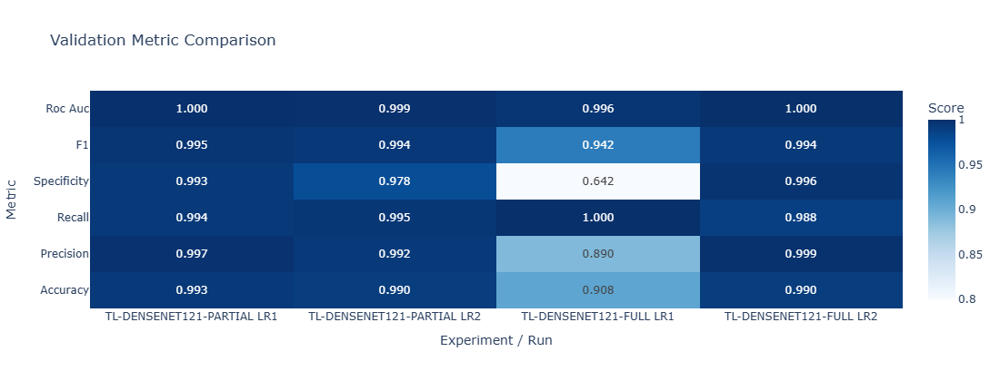

In [21]:
# ============================================================
# 5. Experiment Comparison
# 5-1. Classification Metrics
# ============================================================

import importlib
import cxp.cxp_plot as cxp_plot

importlib.reload(cxp_plot)

cxp_plot.plot_metric_comparison(
    validation_results_df,
    score_range=(0.8, 1.0), 
)

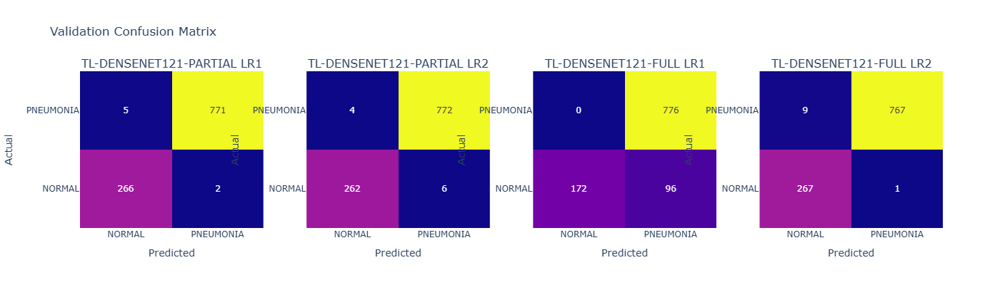

In [22]:
# ============================================================
# 5-2. Confusion Matrix
# ============================================================

cxp_plot.plot_confusion_matrix_comparison(
    validation_results_df
)
 

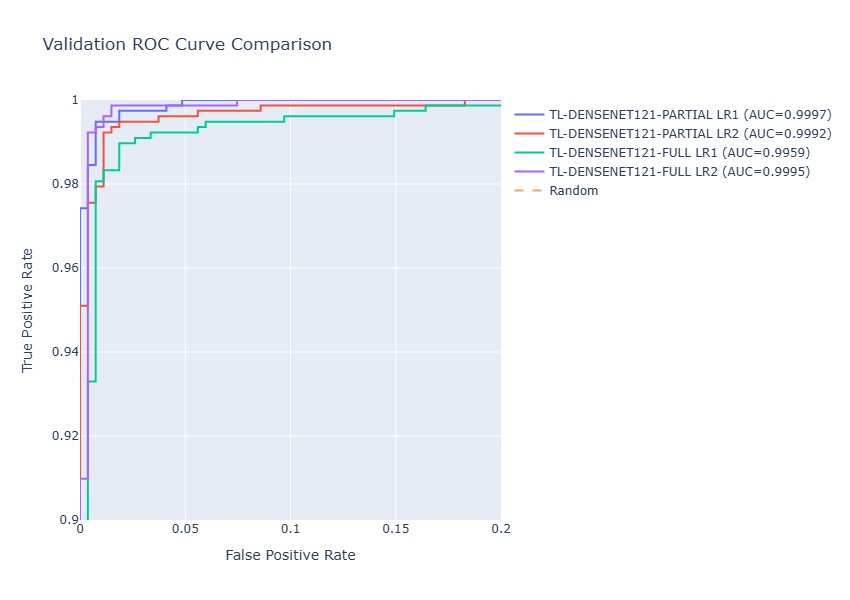

In [26]:
# ============================================================
# 5-3. ROC Curve
# ============================================================

import importlib
import cxp.cxp_plot as cxp_plot

importlib.reload(cxp_plot)

experiment_order = {
    "TL-DENSENET121-PARTIAL": 0,
    "TL-DENSENET121-FULL": 1,
}

run_order = {
    "LR1": 0,
    "LR2": 1,
}

validation_predictions = dict(
    sorted(
        validation_predictions.items(),
        key=lambda item: (
            experiment_order[item[0][0]],
            run_order[item[0][1]],
        )
    )
)

cxp_plot.plot_roc_curve_comparison(
    validation_predictions,
    x_range=(0.0, 0.2),
    y_range=(0.9, 1.0),
)

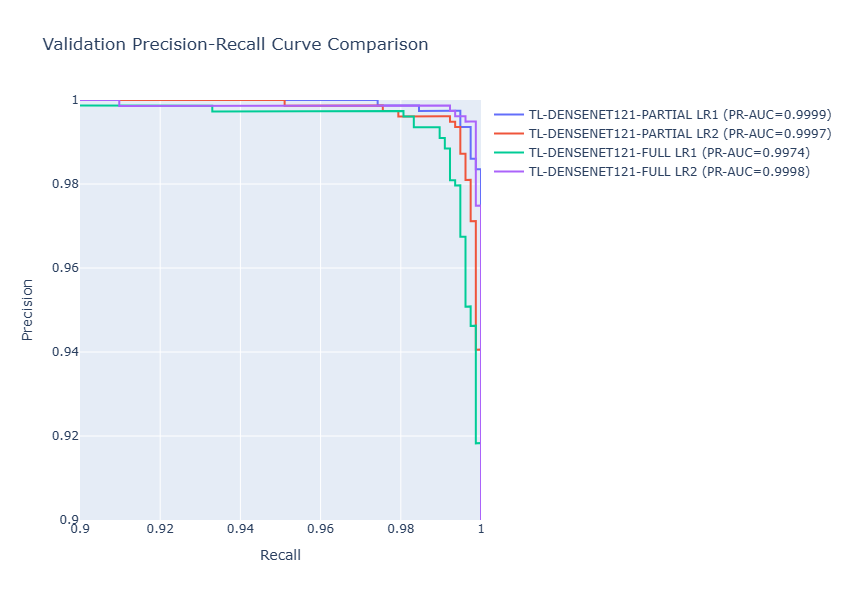

In [27]:
# ============================================================
# 5-4. PR Curve
# ============================================================

cxp_plot.plot_pr_curve_comparison(
    validation_predictions,
    x_range=(0.9, 1.0),
    y_range=(0.9, 1.0),
)

### 6. Learning Curve — Loss

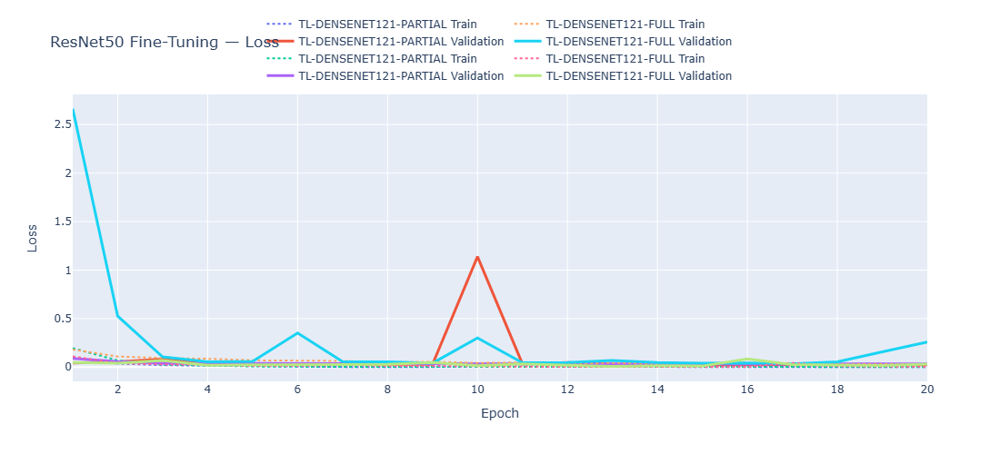

In [28]:
# ============================================================
# 6. Learning Curve
# 6-1. Validation Loss
# ============================================================

cxp_plot.plot_finetuning_history(
    history=history_df,
    experiment_runs=SELECTED_RUNS,
    metric="loss",
)

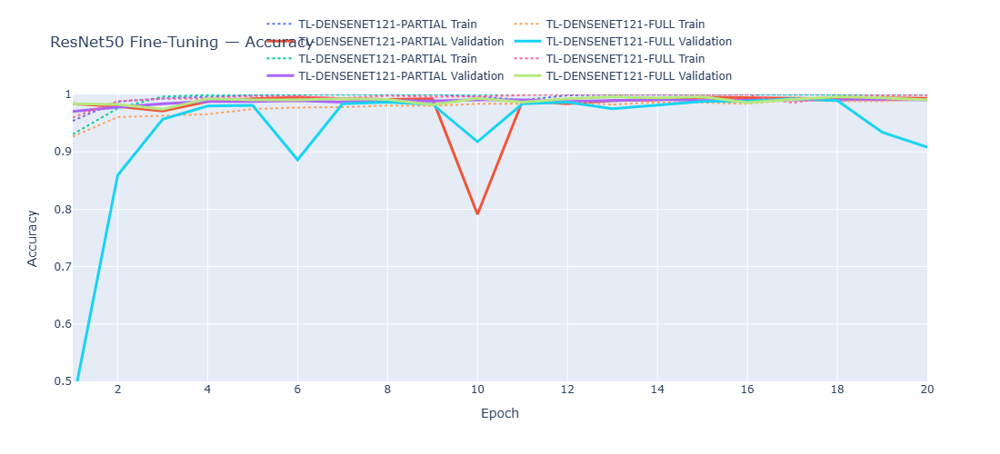

In [30]:
# ============================================================
# 6-2. Validation Accuracy
# ============================================================

cxp_plot.plot_finetuning_history(
    history=history_df,
    experiment_runs=SELECTED_RUNS,
    metric="accuracy",
    y_range=(0.5, 1.0),
)

### 7. Error Analysis

#### -1-1. FP / FN Data

In [31]:
# ============================================================
# 7-1. Error Analysis
# 7-1-1. FP / FN Data
# ============================================================

error_results = {}

for experiment, run in SELECTED_RUNS:

    prediction_result = validation_predictions[
        (experiment, run)
    ]

    error_df = val_df.copy().reset_index(drop=True)

    error_df["y_true"] = prediction_result["labels"]
    error_df["y_pred"] = prediction_result["predictions"]
    error_df["y_prob"] = prediction_result["probabilities"]

    # --------------------------------------------------------
    # False Positive
    # Actual: NORMAL
    # Predicted: PNEUMONIA
    # --------------------------------------------------------

    fp_df = error_df[
        (error_df["y_true"] == 0)
        & (error_df["y_pred"] == 1)
    ].copy()

    # --------------------------------------------------------
    # False Negative
    # Actual: PNEUMONIA
    # Predicted: NORMAL
    # --------------------------------------------------------

    fn_df = error_df[
        (error_df["y_true"] == 1)
        & (error_df["y_pred"] == 0)
    ].copy()

    error_results[(experiment, run)] = {
        "error_df": error_df,
        "fp_df": fp_df,
        "fn_df": fn_df,
    }

    print(f"Run: {experiment} / {run}")
    print(f"False Positive: {len(fp_df)}")
    print(f"False Negative: {len(fn_df)}")
    print()

Run: TL-DENSENET121-PARTIAL / LR1
False Positive: 2
False Negative: 5

Run: TL-DENSENET121-PARTIAL / LR2
False Positive: 6
False Negative: 4

Run: TL-DENSENET121-FULL / LR1
False Positive: 96
False Negative: 0

Run: TL-DENSENET121-FULL / LR2
False Positive: 1
False Negative: 9



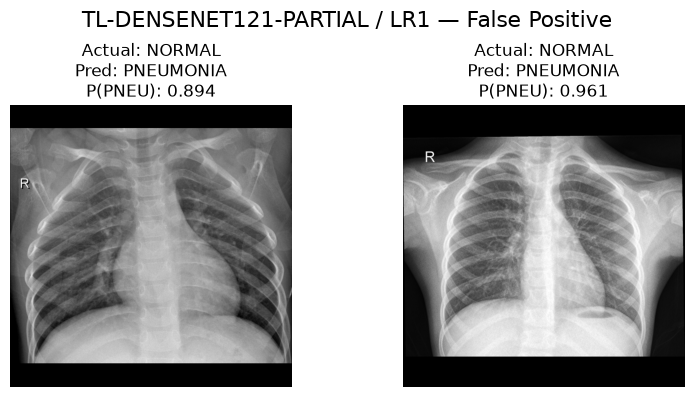

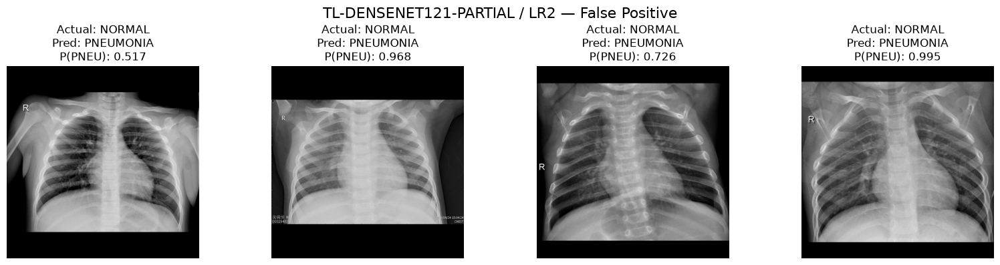

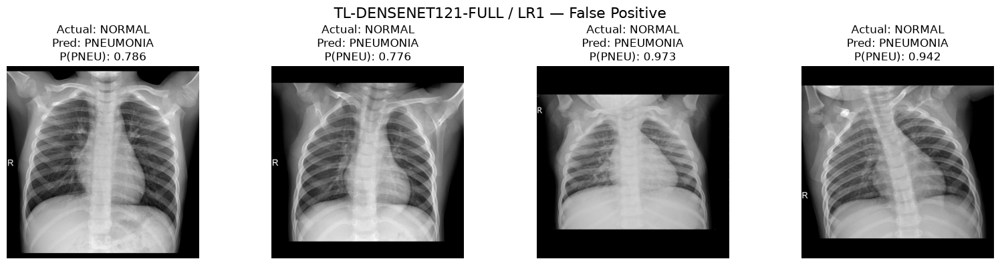

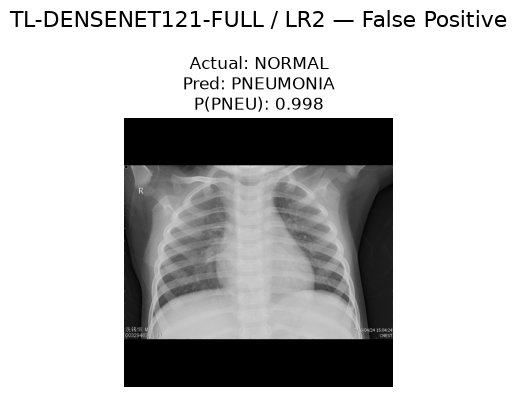

In [32]:
# ============================================================
# 7-1-2. False Positive
# ============================================================


import importlib
import cxp.cxp_plot as cxp_plot

importlib.reload(cxp_plot)



for experiment, run in SELECTED_RUNS:

    fp_df = error_results[(experiment, run)]["fp_df"]

    cxp_plot.show_error_images(
        dataframe=fp_df,
        data_dir=DATASET_TRAIN_DIR,
        idx_to_class=IDX_TO_CLASS,
        n=4,
        title=f"{experiment} / {run} — False Positive",
    )

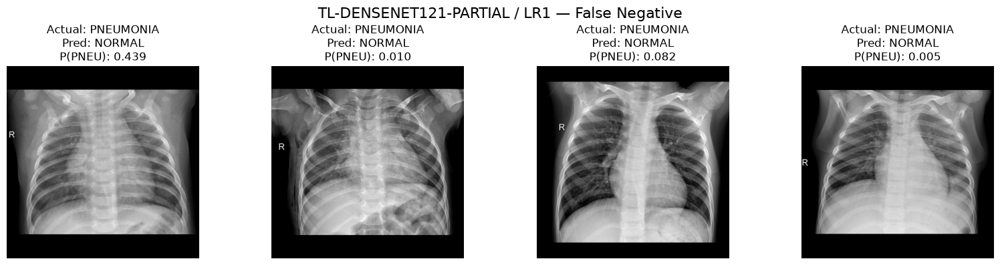

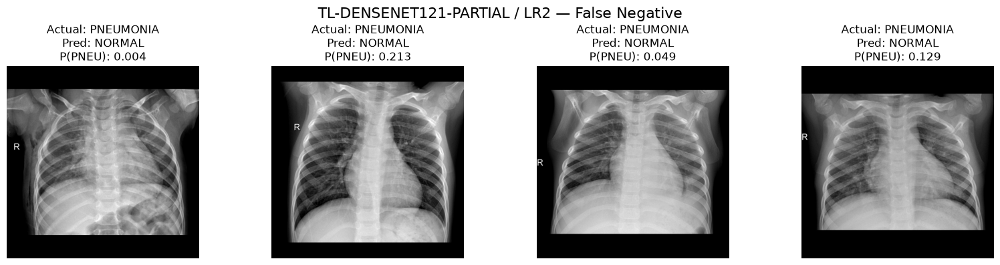

No error images found.


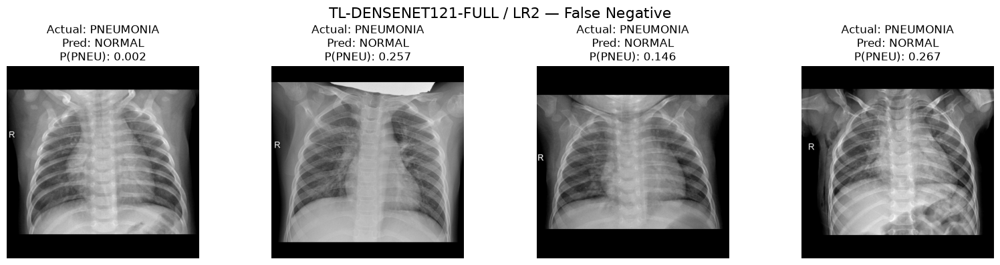

In [33]:
# ============================================================
# 7-1-3. False Negative
# ============================================================

for experiment, run in SELECTED_RUNS:

    fn_df = error_results[(experiment, run)]["fn_df"]

    cxp_plot.show_error_images(
        dataframe=fn_df,
        data_dir=DATASET_TRAIN_DIR,
        idx_to_class=IDX_TO_CLASS,
        n=4,
        title=f"{experiment} / {run} — False Negative",
    )

#### 7-2. Confidence-based Error Analysis

In [34]:
# ============================================================
# 7-2. Confidence-based Error Analysis
# ============================================================

confidence_results = {}

for experiment, run in SELECTED_RUNS:

    fp_df = error_results[(experiment, run)]["fp_df"].copy()
    fn_df = error_results[(experiment, run)]["fn_df"].copy()

    # --------------------------------------------------------
    # False Positive
    # Actual: NORMAL
    # Predicted: PNEUMONIA
    # --------------------------------------------------------

    fp_df["confidence"] = fp_df["y_prob"]

    fp_high_conf = (
        fp_df
        .sort_values(
            "confidence",
            ascending=False,
        )
        .reset_index(drop=True)
    )

    # --------------------------------------------------------
    # False Negative
    # Actual: PNEUMONIA
    # Predicted: NORMAL
    # --------------------------------------------------------

    fn_df["confidence"] = 1 - fn_df["y_prob"]

    fn_high_conf = (
        fn_df
        .sort_values(
            "confidence",
            ascending=False,
        )
        .reset_index(drop=True)
    )

    confidence_results[(experiment, run)] = {
        "fp": fp_high_conf,
        "fn": fn_high_conf,
    }

    # --------------------------------------------------------
    # Display
    # --------------------------------------------------------

    print(f"Run: {experiment} / {run}")

    print(f"\nFalse Positive: {len(fp_high_conf)}")
    display(
        fp_high_conf[
            [
                "Folder",
                "File",
                "y_true",
                "y_pred",
                "y_prob",
                "confidence",
            ]
        ].head(10)
    )

    print(f"\nFalse Negative: {len(fn_high_conf)}")
    display(
        fn_high_conf[
            [
                "Folder",
                "File",
                "y_true",
                "y_pred",
                "y_prob",
                "confidence",
            ]
        ].head(10)
    )

Run: TL-DENSENET121-PARTIAL / LR1

False Positive: 2


,Folder,File,y_true,y_pred,y_prob,confidence
0,NORMAL,NORMAL2-IM-1062-0001.png,0,1,0.961340,0.961340
1,NORMAL,NORMAL2-IM-0412-0001.png,0,1,0.894188,0.894188



False Negative: 5


,Folder,File,y_true,y_pred,y_prob,confidence
0,PNEUMONIA,person301_virus_622.png,1,0,0.004655,0.995345
1,PNEUMONIA,person618_bacteria_2489.png,1,0,0.009615,0.990385
2,PNEUMONIA,person702_virus_1299.png,1,0,0.081772,0.918228
3,PNEUMONIA,person441_virus_894.png,1,0,0.293946,0.706054
4,PNEUMONIA,person432_virus_881.png,1,0,0.438927,0.561073


Run: TL-DENSENET121-PARTIAL / LR2

False Positive: 6


,Folder,File,y_true,y_pred,y_prob,confidence
0,NORMAL,NORMAL2-IM-0412-0001.png,0,1,0.994613,0.994613
1,NORMAL,NORMAL2-IM-0611-0001.png,0,1,0.968307,0.968307
2,NORMAL,NORMAL2-IM-1062-0001.png,0,1,0.948795,0.948795
3,NORMAL,IM-0647-0001.png,0,1,0.726360,0.726360
4,NORMAL,NORMAL2-IM-1365-0001.png,0,1,0.621948,0.621948
5,NORMAL,IM-0517-0001.png,0,1,0.516924,0.516924



False Negative: 4


,Folder,File,y_true,y_pred,y_prob,confidence
0,PNEUMONIA,person618_bacteria_2489.png,1,0,0.004005,0.995995
1,PNEUMONIA,person301_virus_622.png,1,0,0.049171,0.950829
2,PNEUMONIA,person1489_virus_2594.png,1,0,0.129280,0.870720
3,PNEUMONIA,person702_virus_1299.png,1,0,0.213497,0.786503


Run: TL-DENSENET121-FULL / LR1

False Positive: 96


,Folder,File,y_true,y_pred,y_prob,confidence
0,NORMAL,NORMAL2-IM-0611-0001.png,0,1,1.000000,1.000000
1,NORMAL,NORMAL2-IM-0435-0001.png,0,1,0.999888,0.999888
2,NORMAL,NORMAL2-IM-0412-0001.png,0,1,0.997094,0.997094
3,NORMAL,NORMAL2-IM-0621-0001.png,0,1,0.996164,0.996164
4,NORMAL,IM-0215-0001.png,0,1,0.995807,0.995807
5,NORMAL,NORMAL2-IM-1125-0001.png,0,1,0.991183,0.991183
6,NORMAL,NORMAL2-IM-1257-0001.png,0,1,0.990306,0.990306
7,NORMAL,NORMAL2-IM-0654-0001.png,0,1,0.988382,0.988382
8,NORMAL,NORMAL2-IM-0429-0001.png,0,1,0.987514,0.987514
9,NORMAL,NORMAL2-IM-1286-0001.png,0,1,0.985251,0.985251



False Negative: 0


,Folder,File,y_true,y_pred,y_prob,confidence


Run: TL-DENSENET121-FULL / LR2

False Positive: 1


,Folder,File,y_true,y_pred,y_prob,confidence
0,NORMAL,NORMAL2-IM-0611-0001.png,0,1,0.998476,0.998476



False Negative: 9


,Folder,File,y_true,y_pred,y_prob,confidence
0,PNEUMONIA,person432_virus_881.png,1,0,0.001617,0.998383
1,PNEUMONIA,person702_virus_1299.png,1,0,0.040565,0.959435
2,PNEUMONIA,person1489_virus_2594.png,1,0,0.085742,0.914258
3,PNEUMONIA,person781_virus_1412.png,1,0,0.092979,0.907021
4,PNEUMONIA,person798_virus_1430.png,1,0,0.145936,0.854064
5,PNEUMONIA,person301_virus_622.png,1,0,0.216494,0.783506
6,PNEUMONIA,person277_virus_571.png,1,0,0.256949,0.743051
7,PNEUMONIA,person618_bacteria_2489.png,1,0,0.266592,0.733408
8,PNEUMONIA,person1462_virus_2512.png,1,0,0.346104,0.653895


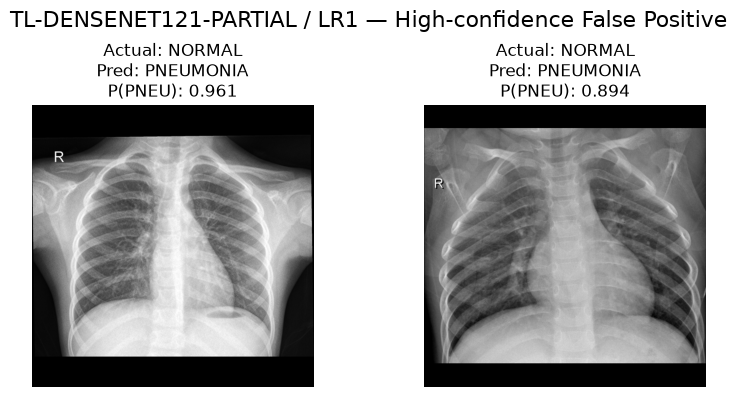

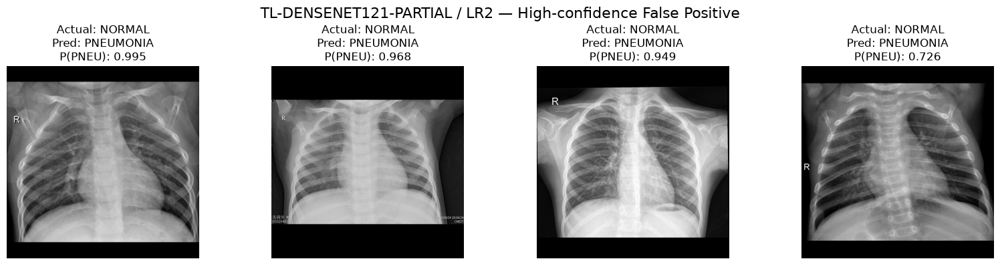

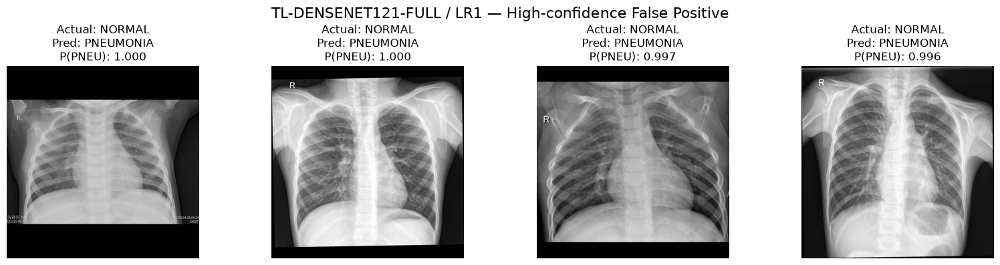

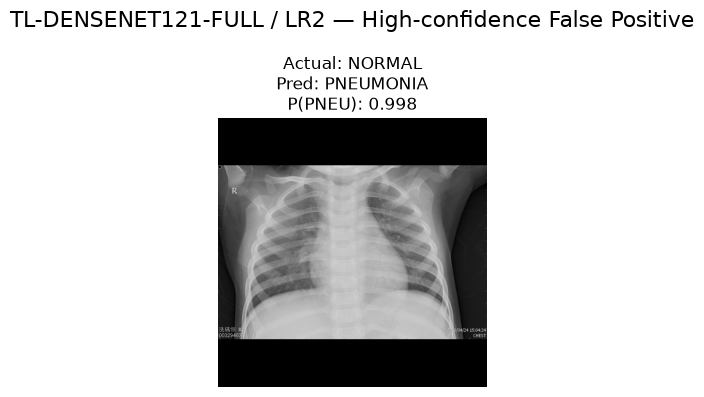

In [35]:
# ============================================================
# 7-2-1. High-confidence False Positive
# ============================================================

for experiment, run in SELECTED_RUNS:

    fp_high_conf = confidence_results[
        (experiment, run)
    ]["fp"]

    cxp_plot.show_error_images(
        dataframe=fp_high_conf,
        data_dir=DATASET_TRAIN_DIR,
        idx_to_class=IDX_TO_CLASS,
        n=4,
        title=f"{experiment} / {run} — High-confidence False Positive",
    )

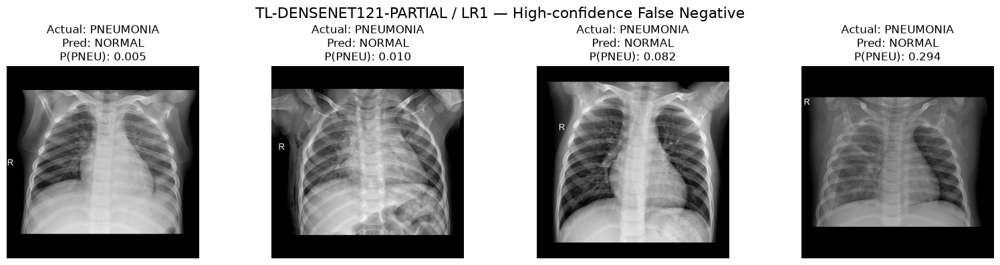

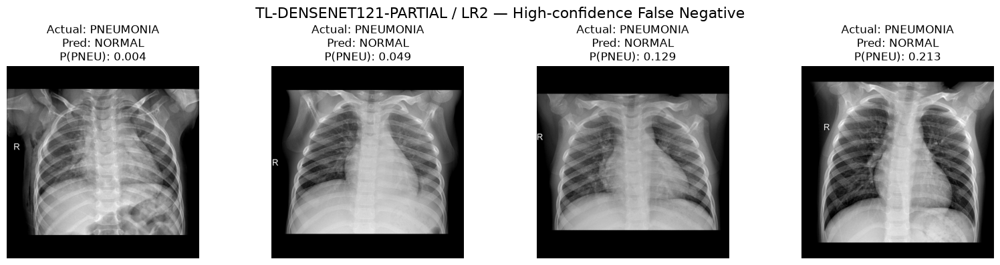

No error images found.


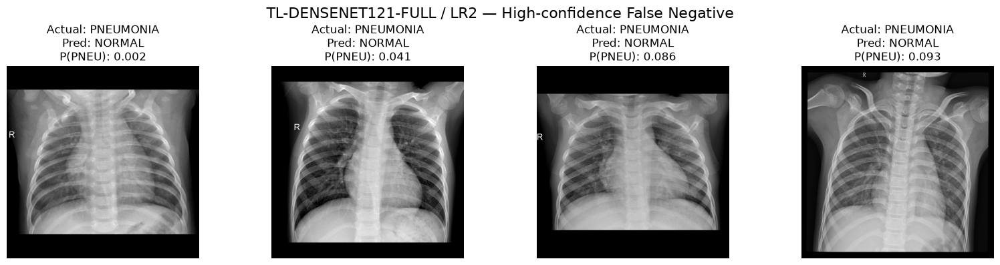

In [36]:
# ============================================================
# 7-2-2. High-confidence False Negative
# ============================================================

for experiment, run in SELECTED_RUNS:

    fn_high_conf = confidence_results[
        (experiment, run)
    ]["fn"]

    cxp_plot.show_error_images(
        dataframe=fn_high_conf,
        data_dir=DATASET_TRAIN_DIR,
        idx_to_class=IDX_TO_CLASS,
        n=4,
        title=f"{experiment} / {run} — High-confidence False Negative",
    )

#### 7-3 Grad-CAM

In [37]:
# ============================================================
# 7-3. Grad-CAM
# ============================================================

import importlib
import cxp.cxp_gradcam as cxp_gradcam

importlib.reload(cxp_gradcam)

<module 'cxp.cxp_gradcam' from 'D:\\DEV\\AI\\projects\\chest-xray-pneumonia\\cxp\\cxp_gradcam.py'>

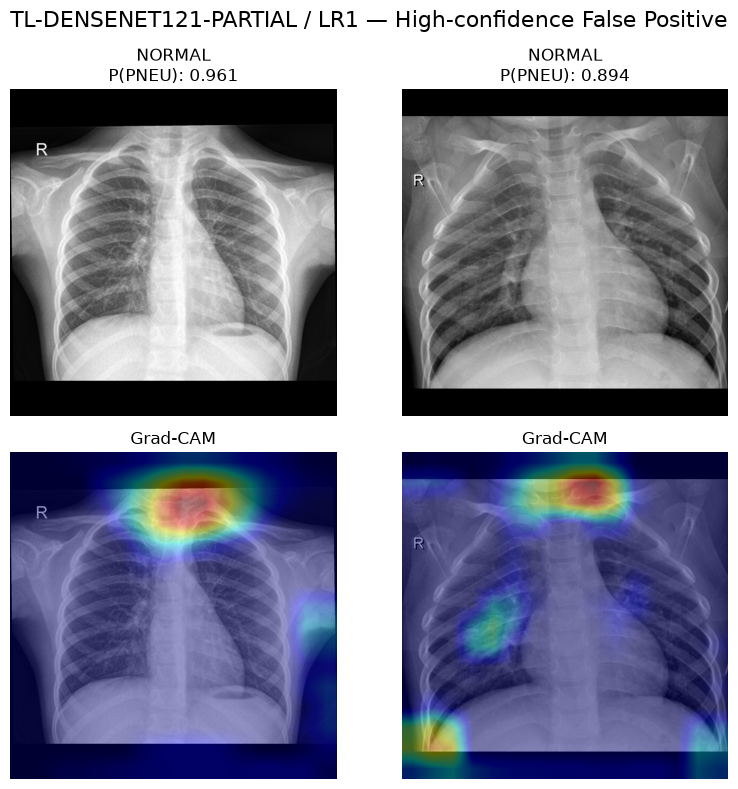

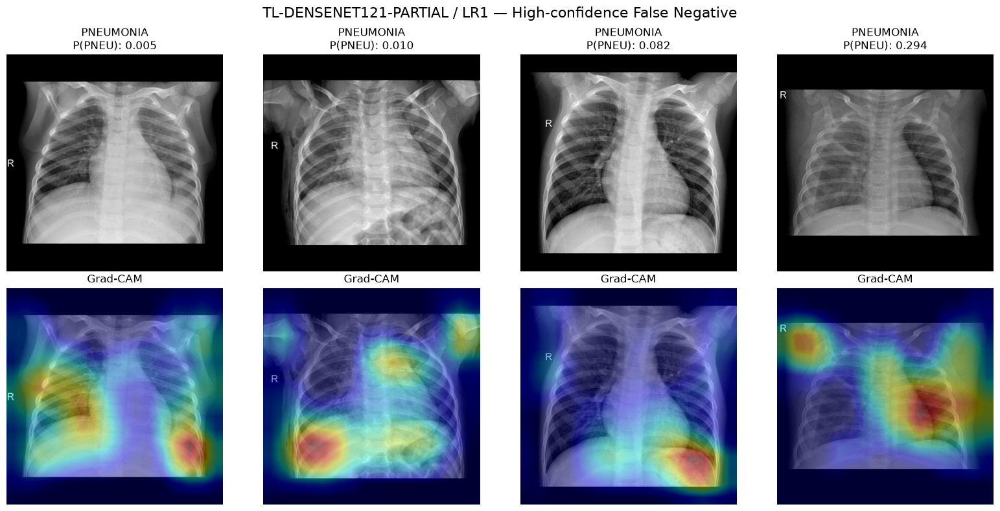

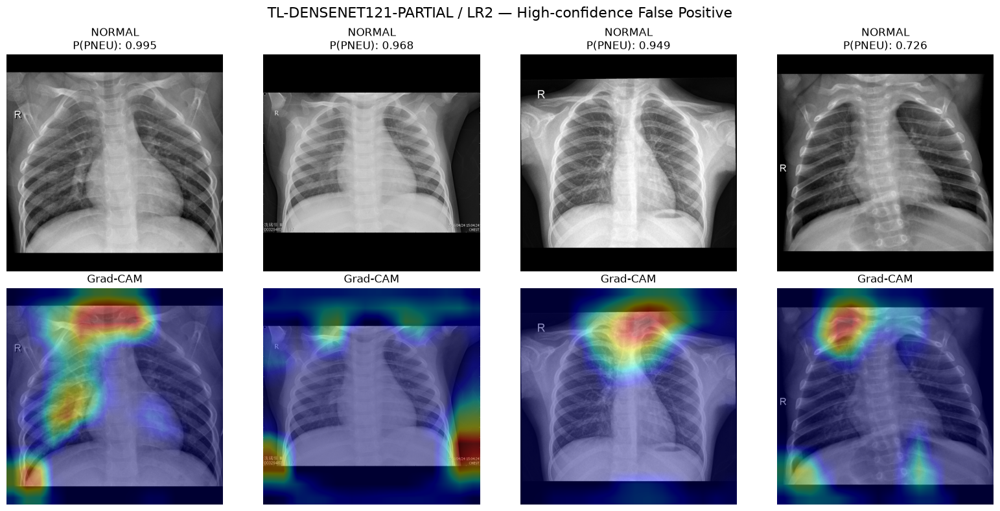

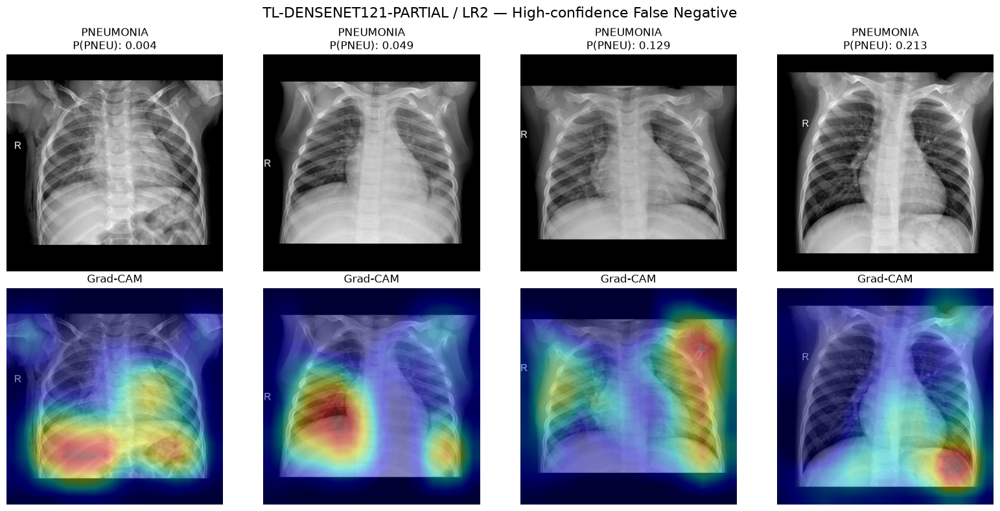

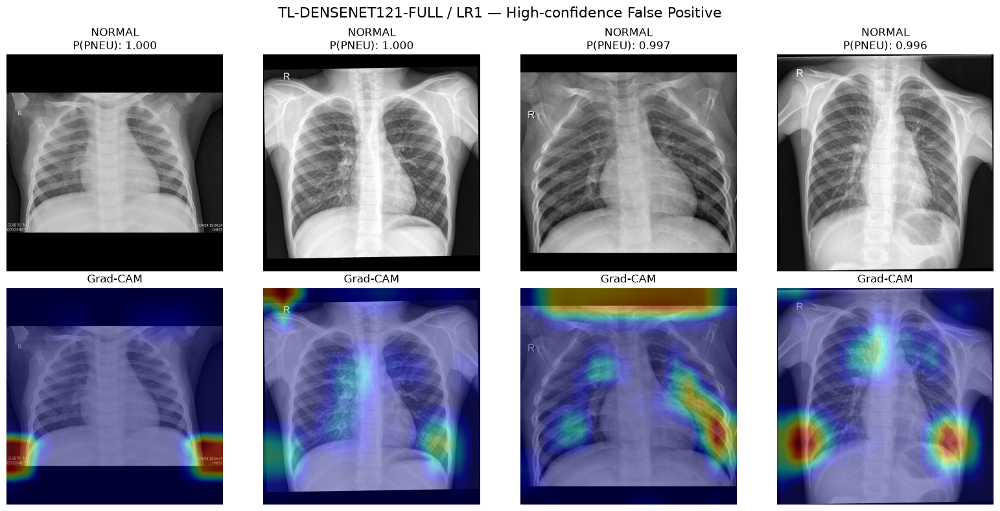

No samples available for Grad-CAM.


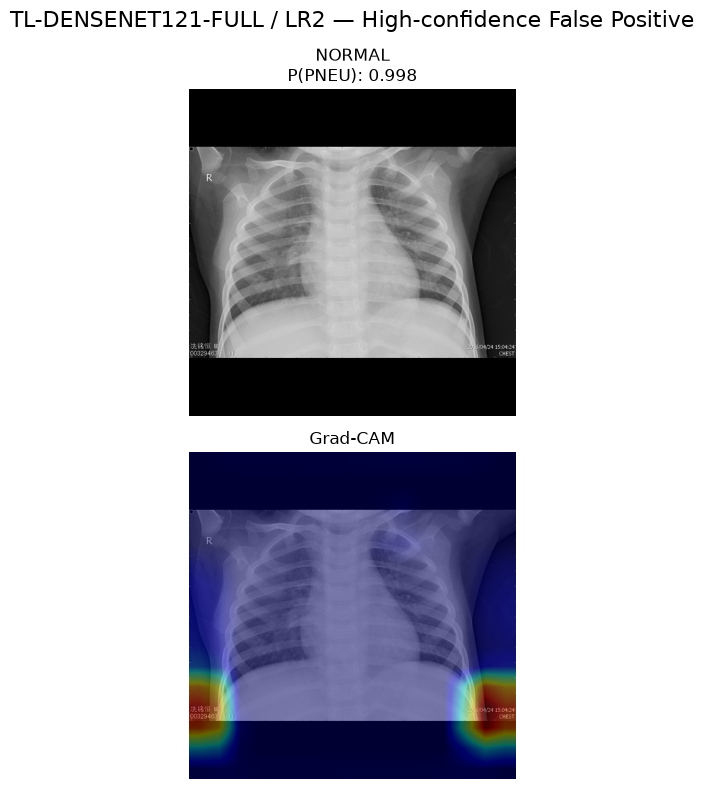

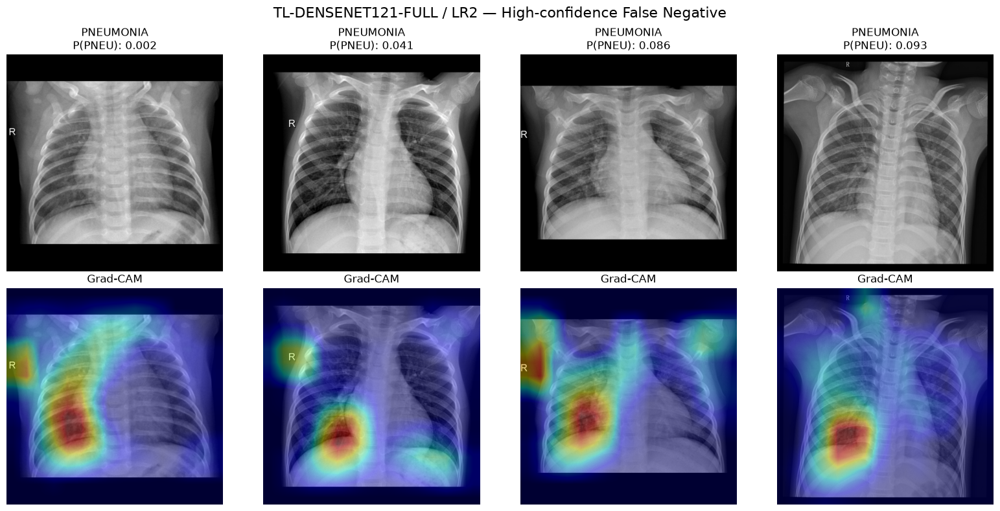

In [38]:
# ============================================================
# 7-3-2. FP / FN Grad-CAM Comparison
# ============================================================

from cxp import cxp_gradcam

N_SAMPLES = 4 

for experiment, run in SELECTED_RUNS:

    # --------------------------------------------------------
    # Experiment / Run 정보
    # --------------------------------------------------------

    run_info = selected_summary[
        (selected_summary["experiment"] == experiment)
        & (selected_summary["run"] == run)
    ].iloc[0]

    # --------------------------------------------------------
    # Load Model
    # --------------------------------------------------------

    model = load_experiment_model(run_info)

    target_layer = cxp_gradcam.get_gradcam_target_layer(
        model=model,
        model_name=run_info["model"],
    )

    gradcam = cxp_gradcam.GradCAM(
        model=model,
        target_layer=target_layer,
    )

    # --------------------------------------------------------
    # Evaluation Transform
    # --------------------------------------------------------

    eval_transform = create_transform(
        image_size=IMAGE_SIZE,
        mean=NORMALIZATION["mean"],
        std=NORMALIZATION["std"],
    )

    # --------------------------------------------------------
    # High-confidence False Positive
    # --------------------------------------------------------

    fp_high_conf = confidence_results[
        (experiment, run)
    ]["fp"]

    cxp_gradcam.plot_gradcam_samples(
        dataframe=fp_high_conf,
        gradcam=gradcam,
        transform=eval_transform,
        image_dir=DATASET_TRAIN_DIR,
        n_samples=N_SAMPLES,
        title_prefix=(
            f"{experiment} / {run} — "
            f"High-confidence False Positive"
        ),
        device=DEVICE,
    )

    # --------------------------------------------------------
    # High-confidence False Negative
    # --------------------------------------------------------

    fn_high_conf = confidence_results[
        (experiment, run)
    ]["fn"]

    cxp_gradcam.plot_gradcam_samples(
        dataframe=fn_high_conf,
        gradcam=gradcam,
        transform=eval_transform,
        image_dir=DATASET_TRAIN_DIR,
        n_samples=N_SAMPLES,
        title_prefix=(
            f"{experiment} / {run} — "
            f"High-confidence False Negative"
        ),
        device=DEVICE,
    )

    # --------------------------------------------------------
    # Cleanup
    # --------------------------------------------------------

    cxp_gradcam.cleanup_gradcam(
        gradcam=gradcam,
        model=model,
    )

***Grad-CAM 기반 Error Analysis***   

False Positive 사례에서 Grad-CAM을 확인한 결과, Partial 모델에서는 목·쇄골 부위와 영상 상단 테두리, Full 모델에서는 이미지 하단의 양쪽 끝단 및 흉곽 외부 여백 등 **폐 실질 외부 영역에 활성화가 나타나는 사례가 확인되었다.**

일부 False Positive 사례에서는 PNEUMONIA 확률이 높게 나타났으며, 모델이 폐의 상태뿐만 아니라 **영상의 배경이나 촬영 특성과 같은 비질환 관련 정보에 영향을 받았을 가능성**을 확인하였다.

False Negative 사례에서는 Partial과 Full 모델 모두 폐 내부 및 하부 흉부 영역에 활성화가 나타나는 사례가 확인되었으나, 해당 특징을 PNEUMONIA로 충분히 구분하지 못한 사례가 나타났다.

따라서 오류 개선을 위해 **영상 외곽의 불필요한 영역을 줄이는 Crop 등의 전처리**와 Fine-Tuning을 통한 추가 학습을 고려할 수 있다.

단, Grad-CAM은 모델의 예측에 영향을 준 영역을 시각화하는 도구이므로 **실제 병변 위치나 의학적 판단 근거로 해석하지 않았다.**



#### 7-4 Error Analysis

Validation set 1,044개에서 Partial은 Correct 1,034, FP 6, FN 4가 발생하였고, Full은 Correct 1,034, FP 1, FN 9가 발생하였다.

- **FP:** Partial 6건, Full 1건으로 일부 사례에서 NORMAL을 PNEUMONIA로 예측하였다. Full에서 FP가 감소하였다.
- **FN:** Partial 4건, Full 9건으로 Full에서 더 많이 발생했으며, 일부 사례에서 PNEUMONIA 확률이 낮게 나타났다.
- **Grad-CAM:** Partial에서는 목·쇄골 부위와 영상 상단 테두리, Full에서는 이미지 하단의 양쪽 끝단 및 흉곽 외부 여백 등 폐 실질 외부 영역에 활성화가 나타나는 사례가 확인되었다. 또한 일부 FN 사례에서는 폐 내부 및 하부 흉부 영역에 활성화가 나타났으나 PNEUMONIA로 분류하지 못하는 사례가 확인되었다.

Grad-CAM은 모델의 예측에 영향을 준 영역을 시각화하는 도구이므로 실제 병변 위치나 의학적 판단 근거로 해석하지 않았다.

#### ----------------------------------------------------------------------------------------------------------------------------------------------------

### 8. Experiment Comment

#### Experiment Objective

**DenseNet121에서 Learning Rate와 Fine-Tuning 방식에 따른 성능 차이를 비교한다.**

* Model: DenseNet121
* Training Mode: Partial / Full
* Optimizer: Adam
* Learning Rate: LR1 / LR2 (1e-3 / 1e-4)
* Epochs: 20
* Input Size: 512 × 512
* Normalization: ImageNet Mean / Std
* Loss: CrossEntropy

#### Result

| Experiment | Run | Accuracy |  Precision |     Recall | Specificity |         F1 |    ROC-AUC |
| ---------- | --- | -------: | ---------: | ---------: | ----------: | ---------: | ---------: |
| Partial    | LR1 |   0.9933 |     0.9974 |     0.9936 |      0.9925 |     0.9955 |     0.9997 |
| Partial    | LR2 |   0.9904 |     0.9923 | **0.9948** |      0.9776 | **0.9936** |     0.9992 |
| Full       | LR1 |   0.9080 |     0.8899 | **1.0000** |      0.6418 |     0.9417 |     0.9959 |
| Full       | LR2 |   0.9904 | **0.9987** |     0.9884 |  **0.9963** |     0.9935 | **0.9995** |

#### Confusion Matrix

| Experiment | Run |  TN | FP | FN |  TP |
| ---------- | --- | --: | -: | -: | --: |
| Partial    | LR1 | 266 |  2 |  5 | 771 |
| Partial    | LR2 | 262 |  6 |  4 | 772 |
| Full       | LR1 | 172 | 96 |  0 | 776 |
| Full       | LR2 | 267 |  1 |  9 | 767 |

#### Interpretation

* **Partial:** LR1은 Accuracy 0.9933, F1 0.9955, ROC-AUC 0.9997로 LR2보다 높은 전체 성능을 보였다. LR2에서는 Recall이 0.9948로 LR1보다 높았지만, Specificity와 Precision은 낮아졌다.
* **Full:** LR1에서는 Recall이 1.0000으로 나타났지만 Specificity가 0.6418로 크게 낮아졌으며, FP가 96건 발생하였다. 반면 LR2에서는 Specificity 0.9963, Precision 0.9987로 크게 개선되고 FP가 1건으로 감소하였다.
* **Learning Rate:** Full Fine-Tuning에서 LR1과 LR2의 차이가 크게 나타났으며, LR2에서 validation 성능과 오류 유형이 보다 안정적인 형태로 나타났다.
* **대표 Run 선정:** LR1과 LR2의 결과를 비교한 결과, 이후 Partial과 Full의 Fine-Tuning 방식 자체를 비교하기 위해 **LR2을 대표 Run으로 선정**하였다.
* **Partial vs Full:** LR2 기준으로 Partial과 Full의 Accuracy는 모두 0.9904로 동일하였다. Full은 Precision, Specificity, ROC-AUC가 높고 FP가 6건에서 1건으로 감소했지만, Recall은 낮아지고 FN은 4건에서 9건으로 증가하였다.
* **Grad-CAM:** 일부 오류 사례에서 활성 영역이 특정 폐 영역에 집중되지 않고 심장·종격동, 하부 흉부 및 영상 가장자리 등 여러 영역에 분산되는 사례가 확인되었다.

#### Decision

**Selected Fine-Tuning Method: Full**

Partial과 Full 각각에 대해 LR1과 LR2를 비교한 결과, **Full Fine-Tuning에서는 Learning Rate에 따른 성능 차이가 크게 나타났다.** 특히 Full LR1은 FP 96건, Specificity 0.6418로 나타난 반면, Full LR2에서는 FP 1건, Specificity 0.9963으로 크게 개선되었다.

LR1과 LR2의 실험 결과를 비교한 후, Fine-Tuning 방식 자체의 차이를 비교하기 위한 공통 Learning Rate로 LR2(1e-4)를 선정하였다

LR2 기준으로 Partial과 Full을 비교하면 Accuracy는 동일하지만, Full은 Precision, Specificity, ROC-AUC가 높고 FP가 감소하였다. 반면 Partial은 Recall이 높고 FN이 적었다.

이러한 결과를 바탕으로 **이후 DenseNet121 실험에서는 Full Fine-Tuning을 기준으로 사용한다.**

#### Next Experiment

선정한 **Full Fine-Tuning + LR2 (1e-4)** 조건을 적용하고, Validation 성능 및 Error Analysis 결과를 기준으로 최종 모델을 비교한다.
